Вы - маркетинговый аналитик развлекательного приложения Procrastinate Pro+. Несколько прошлых месяцев ваш бизнес постоянно нес убытки - в привлечение пользователей была вложена куча денег, а толку никакого. Вам нужно разобраться в причинах этой ситуации.

У вас в распоряжении есть лог сервера с данными о посещениях приложения новыми пользователями, зарегистрировавшимися в период с 2019-05-01 по 2019-10-27, выгрузка их покупок за этот период, а также статистика рекламных расходов. Вам предстоит изучить, как люди пользуются продуктом, когда они начинают покупать, сколько денег приносит каждый клиент, когда он окупается и какие факторы отрицательно влияют на привлечение пользователей.

# Анализ рекламной кампании приложения Procrastinate Pro+

## Описание данных
Таблица visits_log_short (лог сервера с информацией о посещениях сайта):

    User Id — уникальный идентификатор пользователя
    Device — категория устройства пользователя
    Session start — дата и время начала сессии
    Session End — дата и время окончания сессии
    Channel — идентификатор рекламного источника, из которого пришел пользователь
    Region - страна пользователя

Таблица orders_log_short (информация о заказах):

    User Id — уникальный id пользователя, который сделал заказ
    Event Dt — дата и время покупки
    Revenue — выручка

Таблица costs_short (информация о затратах на маркетинг):

    Channel — идентификатор рекламного источника
    Dt — дата
    Costs — затраты на этот рекламный источник в этот день

##  Загрузка данных и подготовка их к анализу


In [1]:
#Импортируем необходимые библиотеки

import pandas as pd
from datetime import datetime, timedelta
from matplotlib import pyplot as plt
import numpy as np
import seaborn as sns

In [2]:
# Загружаем данные

sessions = pd.read_csv('/datasets/visits_info_short.csv')  # сессии
orders = pd.read_csv('/datasets/orders_info_short.csv')  # заказы
costs = pd.read_csv('/datasets/costs_info_short.csv')  # затраты на маркетинг

In [3]:
sessions.head()

,User Id,Region,Device,Channel,Session Start,Session End
0,981449118918,United States,iPhone,organic,2019-05-01 02:36:01,2019-05-01 02:45:01
1,278965908054,United States,iPhone,organic,2019-05-01 04:46:31,2019-05-01 04:47:35
2,590706206550,United States,Mac,organic,2019-05-01 14:09:25,2019-05-01 15:32:08
3,326433527971,United States,Android,TipTop,2019-05-01 00:29:59,2019-05-01 00:54:25
4,349773784594,United States,Mac,organic,2019-05-01 03:33:35,2019-05-01 03:57:40


In [4]:
sessions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309901 entries, 0 to 309900
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   User Id        309901 non-null  int64 
 1   Region         309901 non-null  object
 2   Device         309901 non-null  object
 3   Channel        309901 non-null  object
 4   Session Start  309901 non-null  object
 5   Session End    309901 non-null  object
dtypes: int64(1), object(5)
memory usage: 14.2+ MB


In [5]:
# Приведем названия столбцов к правильной стилистике
sessions.columns= sessions.columns.str.lower()
sessions = sessions.rename(columns={'user id': 'user_id','session start':'session_start','session end':'session_end'})
sessions.head()

,user_id,region,device,channel,session_start,session_end
0,981449118918,United States,iPhone,organic,2019-05-01 02:36:01,2019-05-01 02:45:01
1,278965908054,United States,iPhone,organic,2019-05-01 04:46:31,2019-05-01 04:47:35
2,590706206550,United States,Mac,organic,2019-05-01 14:09:25,2019-05-01 15:32:08
3,326433527971,United States,Android,TipTop,2019-05-01 00:29:59,2019-05-01 00:54:25
4,349773784594,United States,Mac,organic,2019-05-01 03:33:35,2019-05-01 03:57:40


In [6]:
orders = orders.rename(columns = {'User Id':'user_id','Event Dt':'event_dt','Revenue':'revenue'})
orders.head()

,user_id,event_dt,revenue
0,188246423999,2019-05-01 23:09:52,4.99
1,174361394180,2019-05-01 12:24:04,4.99
2,529610067795,2019-05-01 11:34:04,4.99
3,319939546352,2019-05-01 15:34:40,4.99
4,366000285810,2019-05-01 13:59:51,4.99


In [7]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40212 entries, 0 to 40211
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   user_id   40212 non-null  int64  
 1   event_dt  40212 non-null  object 
 2   revenue   40212 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 942.6+ KB


In [8]:
costs.columns= costs.columns.str.lower()
costs.head()

,dt,channel,costs
0,2019-05-01,FaceBoom,113.3
1,2019-05-02,FaceBoom,78.1
2,2019-05-03,FaceBoom,85.8
3,2019-05-04,FaceBoom,136.4
4,2019-05-05,FaceBoom,122.1


In [9]:
costs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1800 entries, 0 to 1799
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   dt       1800 non-null   object 
 1   channel  1800 non-null   object 
 2   costs    1800 non-null   float64
dtypes: float64(1), object(2)
memory usage: 42.3+ KB


Пропуски в данных не обнаружены, требуется только привести даты к формату datetime.

In [10]:
# преобразование данных о времени
sessions['session_start'] = pd.to_datetime(sessions['session_start'])
sessions['session_end'] = pd.to_datetime(sessions['session_end'])
orders['event_dt'] = pd.to_datetime(orders['event_dt'])
costs['dt'] = pd.to_datetime(costs['dt']).dt.date 

In [11]:
# проверка на дубликаты sessions
len_before = len(sessions)
sessions.drop_duplicates().reset_index(drop=True)
len_after = len(sessions)

if len_before > len_after: print('Дубликаты в sesions выброшены')
else: print('Дубликаты в sessions не обнаружены')
    
# проверка на дубликаты sessions
len_before = len(orders)
orders.drop_duplicates().reset_index(drop=True)
len_after = len(orders)

if len_before > len_after: print('Дубликаты в orders выброшены')
else: print('Дубликаты в orders не обнаружены')
    
# проверка на дубликаты costs
len_before = len(costs)
costs.drop_duplicates().reset_index(drop=True)
len_after = len(costs)

if len_before > len_after: print('Дубликаты в costs выброшены')
else: print('Дубликаты в costs не обнаружены')

Дубликаты в sessions не обнаружены
Дубликаты в orders не обнаружены
Дубликаты в costs не обнаружены


##  Зададим функции для расчета и анализа LTV, ROI, удержания и конверсии

Разрешается использовать функции, с которыми вы познакомились в теоретических уроках.

In [12]:
def get_profiles(sessions, orders, events, ad_costs, event_names=[]):

    # находим параметры первых посещений
    profiles = (
        sessions.sort_values(by=['user_id', 'session_start'])
        .groupby('user_id')
        .agg(
            {
                'session_start': 'first',
                'channel': 'first',
                'device': 'first',
                'region': 'first',
            }
        )
        .rename(columns={'session_start': 'first_ts'})
        .reset_index()
    )

    # для когортного анализа определяем дату первого посещения
    # и первый день месяца, в который это посещение произошло
    profiles['dt'] = profiles['first_ts'].dt.date
    profiles['month'] = profiles['first_ts'].astype('datetime64[M]')

    # добавляем признак платящих пользователей
    profiles['payer'] = profiles['user_id'].isin(orders['user_id'].unique())

    # добавляем флаги для всех событий из event_names
    for event in event_names:
        if event in events['event_name'].unique():
            profiles[event] = profiles['user_id'].isin(
                events.query('event_name == @event')['user_id'].unique()
            )

    # считаем количество уникальных пользователей
    # с одинаковыми источником и датой привлечения
    new_users = (
        profiles.groupby(['dt', 'channel'])
        .agg({'user_id': 'nunique'})
        .rename(columns={'user_id': 'unique_users'})
        .reset_index()
    )

    # объединяем траты на рекламу и число привлечённых пользователей
    ad_costs = ad_costs.merge(new_users, on=['dt', 'channel'], how='left')

    # делим рекламные расходы на число привлечённых пользователей
    ad_costs['acquisition_cost'] = ad_costs['costs'] / ad_costs['unique_users']

    # добавляем стоимость привлечения в профили
    profiles = profiles.merge(
        ad_costs[['dt', 'channel', 'acquisition_cost']],
        on=['dt', 'channel'],
        how='left',
    )

    # стоимость привлечения органических пользователей равна нулю
    profiles['acquisition_cost'] = profiles['acquisition_cost'].fillna(0)

    return profiles

In [13]:
# функция для расчёта LTV и ROI
def get_ltv(
    profiles,
    purchases,
    observation_date,
    horizon_days,
    dimensions=[],
    ignore_horizon=False,
):

    last_suitable_acquisition_date = observation_date
    if not ignore_horizon:
        last_suitable_acquisition_date = observation_date - timedelta(
            days=horizon_days - 1
        )
    result_raw = profiles.query('dt <= @last_suitable_acquisition_date')
    result_raw = result_raw.merge(
        purchases[['user_id', 'event_dt', 'revenue']], on='user_id', how='left'
    )
    result_raw['lifetime'] = (
        result_raw['event_dt'] - result_raw['first_ts']
    ).dt.days

    if len(dimensions) == 0:
        result_raw['cohort'] = 'All users'
        dimensions = dimensions + ['cohort']

    def group_by_dimensions(df, dims, horizon_days):
        result = df.pivot_table(
            index=dims, columns='lifetime', values='revenue', aggfunc='sum'
        )
        result = result.fillna(0).cumsum(axis=1)
        cohort_sizes = (
            df.groupby(dims)
            .agg({'user_id': 'nunique'})
            .rename(columns={'user_id': 'cohort_size'})
        )
        result = cohort_sizes.merge(result, on=dims, how='left').fillna(0)
        result = result.div(result['cohort_size'], axis=0)
        result = result[['cohort_size'] + list(range(horizon_days))]
        result['cohort_size'] = cohort_sizes
        cac = df[['user_id', 'acquisition_cost'] + dims].drop_duplicates()
        cac = (
            cac.groupby(dims)
            .agg({'acquisition_cost': 'mean'})
            .rename(columns={'acquisition_cost': 'cac'})
        )
        roi = result.div(cac['cac'], axis=0)
        roi = roi[~roi['cohort_size'].isin([np.inf])]
        roi['cohort_size'] = cohort_sizes
        roi['cac'] = cac['cac']
        roi = roi[['cohort_size', 'cac'] + list(range(horizon_days))]
        return result, roi

    result_grouped, roi_grouped = group_by_dimensions(
        result_raw, dimensions, horizon_days
    )
    if 'cohort' in dimensions:
        dimensions = []
    result_in_time, roi_in_time = group_by_dimensions(
        result_raw, dimensions + ['dt'], horizon_days
    )

    return (
        result_raw,  # сырые данные
        result_grouped,  # таблица LTV
        result_in_time,  # таблица динамики LTV
        roi_grouped,  # таблица ROI
        roi_in_time,  # таблица динамики ROI
    )


In [14]:
# функция для сглаживания датафрейма
def filter_data(df, window):
    for column in df.columns.values:
        df[column] = df[column].rolling(window).mean() 
    return df

In [15]:
# функция для визуализации LTV и ROI
def plot_ltv_roi(ltv, ltv_history, roi, roi_history, horizon, window=7):

    plt.figure(figsize=(30, 150))
    plt.rcParams.update({'font.size': 22})
    

    ltv = ltv.drop(columns=['cohort_size'])
    ltv_history = ltv_history.drop(columns=['cohort_size'])[[horizon - 1]]
    cac_history = roi_history[['cac']]
    roi = roi.drop(columns=['cohort_size', 'cac'])
    roi_history = roi_history.drop(columns=['cohort_size', 'cac'])[
        [horizon - 1]
    ]

    # первый график — кривые ltv
    ax1 = plt.subplot(6, 1, 1)
    ltv.T.plot(grid=True, ax=ax1)
    plt.legend()
    plt.xlabel('Лайфтайм')
    plt.title('LTV')

    # второй график — динамика ltv
    ax2 = plt.subplot(6, 1, 2, sharey=ax1)
    columns = [name for name in ltv_history.index.names if name not in ['dt']]
    filtered_data = ltv_history.pivot_table(
        index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax2)
    plt.xlabel('Дата привлечения')
    plt.title('Динамика LTV пользователей на {}-й день'.format(horizon))

    # третий график — динамика cac
    ax3 = plt.subplot(6, 1, 3, sharey=ax1)
    columns = [name for name in cac_history.index.names if name not in ['dt']]
    filtered_data = cac_history.pivot_table(
        index='dt', columns=columns, values='cac', aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax3)
    plt.xlabel('Дата привлечения')
    plt.title('Динамика стоимости привлечения пользователей')

    # четвёртый график — кривые roi
    ax4 = plt.subplot(6, 1, 4)
    roi.T.plot(grid=True, ax=ax4)
    plt.axhline(y=1, color='red', linestyle='--', label='Уровень окупаемости')
    plt.legend()
    plt.xlabel('Лайфтайм')
    plt.title('ROI')

    # пятый график — динамика roi
    ax5 = plt.subplot(6, 1, 5, sharey=ax4)
    columns = [name for name in roi_history.index.names if name not in ['dt']]
    filtered_data = roi_history.pivot_table(
        index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax5)
    plt.axhline(y=1, color='red', linestyle='--', label='Уровень окупаемости')
    plt.xlabel('Дата привлечения')
    plt.title('Динамика ROI пользователей на {}-й день'.format(horizon))

    plt.tight_layout()
    plt.show()

In [16]:
def get_conversion(
    profiles,
    purchases,  # заменили sessions
    observation_date,
    horizon_days,
    dimensions=[],
    ignore_horizon=False,
):

    # Шаг 1. Получить пользовательские профили и данные о покупках
    # передаём их в качестве аргументов profiles и purchases

    # исключаем пользователей, не «доживших» до горизонта анализа
    last_suitable_acquisition_date = observation_date
    if not ignore_horizon:
        last_suitable_acquisition_date = observation_date - timedelta(
            days=horizon_days - 1
        )
    result_raw = profiles.query('dt <= @last_suitable_acquisition_date')

    # Шаг 2. Найти дату и время первой покупки для каждого пользователя
    first_purchases = (
        purchases.sort_values(by=['user_id', 'event_dt'])
        .groupby('user_id')
        .agg({'event_dt': 'first'})
        .reset_index()
    )

    # Шаг 3. Добавить данные о покупках в профили
    result_raw = result_raw.merge(
        first_purchases[['user_id', 'event_dt']], on='user_id', how='left'
    )

    # Шаг 4. Рассчитать лайфтайм для каждой покупки
    result_raw['lifetime'] = (
        result_raw['event_dt'] - result_raw['first_ts']
    ).dt.days

    # функция для группировки таблицы по желаемым признакам
    def group_by_dimensions(df, dims, horizon_days):

        # Шаг 5. Построить таблицу конверсии
        result = df.pivot_table(
            index=dims, columns='lifetime', values='user_id', aggfunc='nunique'
        )

        # Шаг 6. Посчитать сумму с накоплением для каждой строки
        result = result.fillna(0).cumsum(axis = 1)

        # Шаг 7. Вычислить размеры когорт
        cohort_sizes = (
            df.groupby(dims)
            .agg({'user_id': 'nunique'})
            .rename(columns={'user_id': 'cohort_size'})
        )

        # Шаг 8. Объединить таблицы размеров когорт и конверсии
        result = cohort_sizes.merge(result, on=dims, how='left').fillna(0)

        # Шаг 9. Разделить каждую «ячейку» в строке на размер когорты
        result = result.div(result['cohort_size'], axis=0)

        # исключаем все лайфтаймы, превышающие горизонт анализа
        result = result[['cohort_size'] + list(range(horizon_days))]
        # восстанавливаем размеры когорт
        result['cohort_size'] = cohort_sizes
        return result

    # получаем таблицу конверсии
    result_grouped = group_by_dimensions(result_raw, dimensions, horizon_days)

    # получаем таблицу динамики конверсии
    result_in_time = group_by_dimensions(
        result_raw, dimensions + ['dt'], horizon_days
    )

    # возвращаем обе таблицы и сырые данные
    return result_raw, result_grouped, result_in_time 

In [17]:
def get_retention(
    profiles,
    sessions,
    observation_date,
    horizon_days,
    dimensions=[],
    ignore_horizon=False,
):

    # добавляем столбец payer в передаваемый dimensions список
    dimensions = ['payer'] + dimensions

    # исключаем пользователей, не «доживших» до горизонта анализа
    last_suitable_acquisition_date = observation_date
    if not ignore_horizon:
        last_suitable_acquisition_date = observation_date - timedelta(
            days=horizon_days - 1
        )
    result_raw = profiles.query('dt <= @last_suitable_acquisition_date')

    # собираем «сырые» данные для расчёта удержания
    result_raw = result_raw.merge(
        sessions[['user_id', 'session_start']], on='user_id', how='left'
    )
    result_raw['lifetime'] = (
        result_raw['session_start'] - result_raw['first_ts']
    ).dt.days

    # функция для группировки таблицы по желаемым признакам
    def group_by_dimensions(df, dims, horizon_days):
        result = df.pivot_table(
            index=dims, columns='lifetime', values='user_id', aggfunc='nunique'
        )
        cohort_sizes = (
            df.groupby(dims)
            .agg({'user_id': 'nunique'})
            .rename(columns={'user_id': 'cohort_size'})
        )
        result = cohort_sizes.merge(result, on=dims, how='left').fillna(0)
        result = result.div(result['cohort_size'], axis=0)
        result = result[['cohort_size'] + list(range(horizon_days))]
        result['cohort_size'] = cohort_sizes
        return result

    # получаем таблицу удержания
    result_grouped = group_by_dimensions(result_raw, dimensions, horizon_days)

    # получаем таблицу динамики удержания
    result_in_time = group_by_dimensions(
        result_raw, dimensions + ['dt'], horizon_days
    )

    # возвращаем обе таблицы и сырые данные
    return result_raw, result_grouped, result_in_time

In [18]:
def plot_retention(retention, retention_history, horizon):

    # задаём размер сетки для графиков
    plt.figure(figsize=(15, 10))

    # исключаем размеры когорт и удержания первого дня
    retention = retention.drop(columns=['cohort_size', 0])

    # если в индексах таблицы удержания только payer,
    # добавляем второй признак — cohort
    if retention.index.nlevels == 1:
        retention['cohort'] = 'All users'
        retention = retention.reset_index().set_index(['cohort', 'payer'])

    # в таблице графиков — два столбца и две строки, четыре ячейки
    # в первой строим кривые удержания платящих пользователей
    ax1 = plt.subplot(2, 2, 1)
    retention.query('payer == True').droplevel('payer').T.plot(
        grid=True, ax=ax1
    )
    plt.legend()
    plt.xlabel('Лайфтайм')
    plt.title('Удержание платящих пользователей')

    # во второй ячейке строим кривые удержания неплатящих
    # вертикальная ось — от графика из первой ячейки
    ax2 = plt.subplot(2, 2, 2, sharey = ax1)
    retention.query('payer == False').droplevel('payer').T.plot(
        grid=True, ax=ax2
    )
    plt.legend()
    plt.xlabel('Лайфтайм')
    plt.title('Удержание неплатящих пользователей')

    # в третьей ячейке — динамика удержания платящих
    ax3 = plt.subplot(2, 2, 3)
    # получаем названия столбцов для сводной таблицы
    columns = [
        name
        for name in retention_history.index.names
        if name not in ['dt', 'payer']
    ]
    # фильтруем данные, строим сводную таблицу и график по ней
    retention_history.query('payer == True').pivot_table(
        index='dt', columns=columns, values=horizon-1, aggfunc='mean'
    ).plot(grid=True, ax=ax3)
    plt.xlabel('Дата привлечения')
    plt.title(
        'Динамика удержания платящих пользователей на {}-й день'.format(
            horizon
        )
    )
    
    # в четвёртой ячейке — динамика удержания неплатящих
    ax4 = plt.subplot(2, 2, 4, sharey = ax3)
    # фильтруем данные, строим сводную таблицу и график по ней
    retention_history.query('payer == False').pivot_table(
        index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
    ).plot(grid=True, ax=ax4)
    plt.xlabel('Дата привлечения')
    plt.title(
        'Динамика удержания неплатящих пользователей на {}-й день'.format(
            horizon
        )
    )

    # исключаем наложение графиков друг на друга
    plt.tight_layout()

    plt.show()


In [19]:
def plot_conversion(conversion, conversion_history, horizon, window=7):

    # задаём размер сетки для графиков
    plt.figure(figsize=(15, 5))

    # исключаем размеры когорт
    conversion = conversion.drop(columns=['cohort_size'])
    # в таблице динамики оставляем только нужный лайфтайм
    conversion_history = conversion_history.drop(columns=['cohort_size'])[
        [horizon - 1]
    ]

    # первый график — кривые конверсии
    ax1 = plt.subplot(1, 2, 1)
    conversion.T.plot(grid=True, ax=ax1)
    plt.legend()
    plt.xlabel('Лайфтайм')
    plt.title('Конверсия пользователей')

    # второй график — динамика конверсии
    ax2 = plt.subplot(1, 2, 2, sharey=ax1)
    columns = [
        # столбцами сводной таблицы станут все столбцы индекса, кроме даты
        name for name in conversion_history.index.names if name not in ['dt']
    ]
    filtered_data = conversion_history.pivot_table(
        index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax2)
    plt.xlabel('Дата привлечения')
    plt.title('Динамика конверсии пользователей на {}-й день'.format(horizon))

    plt.tight_layout()
    plt.show()


## Исследовательский анализ данных

### Построение профилей пользователей

In [20]:
# Создаём датафрейм с пользователями

profiles = get_profiles(sessions, orders, None, costs)
profiles.head()


,user_id,first_ts,channel,device,region,dt,month,payer,acquisition_cost
0,599326,2019-05-07 20:58:57,FaceBoom,Mac,United States,2019-05-07,2019-05-01,True,1.088172
1,4919697,2019-07-09 12:46:07,FaceBoom,iPhone,United States,2019-07-09,2019-07-01,False,1.107237
2,6085896,2019-10-01 09:58:33,organic,iPhone,France,2019-10-01,2019-10-01,False,0.000000
3,22593348,2019-08-22 21:35:48,AdNonSense,PC,Germany,2019-08-22,2019-08-01,False,0.988235
4,31989216,2019-10-02 00:07:44,YRabbit,iPhone,United States,2019-10-02,2019-10-01,False,0.230769


In [21]:
# найдем максимальную и минимальную даты привлечения

min_date = profiles['dt'].min() 
max_date = profiles['dt'].max()

print(f'В наших данных пользователей привлекали с {min_date} по {max_date}')

В наших данных пользователей привлекали с 2019-05-01 по 2019-10-27


,payer
region,
United States,6.901862
Germany,4.111875
UK,3.982930
France,3.799427


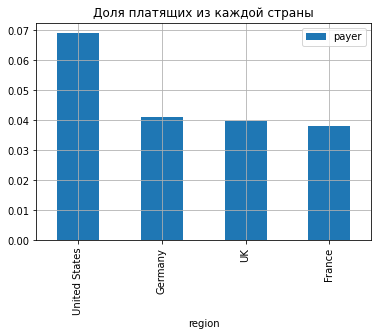

In [22]:
(profiles
 .groupby('region')
 .agg({'payer':'mean'})
 .sort_values(by = 'payer', ascending = False)
 .plot(kind = 'bar', grid = True))

plt.title('Доля платящих из каждой страны')

(profiles
 .groupby('region')
 .agg({'payer':'mean'})
 .sort_values(by = 'payer', ascending = False)
 )*100

Выводы:
 1. Больше всего платящих пользователей зарегистрировалось из США, почти в два раза, чем из другой страны
 2. Количество плательщиков из Германии, Англии и Франции примерно одинаковое
 4. В наших данных пользователей привлекали с 2019-05-01 по 2019-10-27

,payer
device,
Mac,6.364423
iPhone,6.207897
Android,5.851793
PC,5.046790


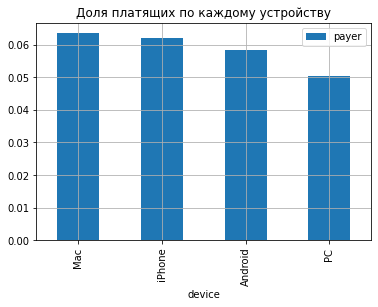

In [23]:
(profiles
 .groupby('device')
 .agg({'payer':'mean'})
 .sort_values(by = 'payer', ascending = False)
 .plot(kind = 'bar', grid = True))

plt.title('Доля платящих по каждому устройству')

(profiles
 .groupby('device')
 .agg({'payer':'mean'})
 .sort_values(by = 'payer', ascending = False)*100)

Выводы:
 1. Лидер по количеству платящих пользователей - Mac и iPhone, чуть отстает Android
 2. Меньше всего - у PC

,payer
channel,
FaceBoom,12.204914
AdNonSense,11.340206
lambdaMediaAds,10.469986
TipTop,9.600736
RocketSuperAds,7.913669
WahooNetBanner,5.296387
YRabbit,3.826531
MediaTornado,3.574702
LeapBob,3.063253


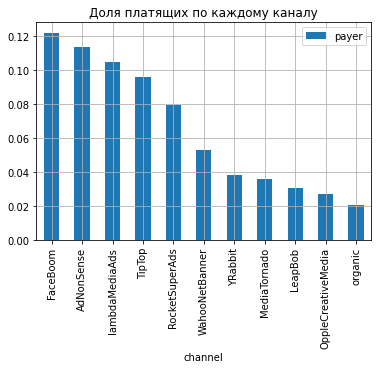

In [24]:
(profiles
 .groupby('channel')
 .agg({'payer':'mean'})
 .sort_values(by = 'payer', ascending = False)
 .plot(kind = 'bar', grid = True))

plt.title('Доля платящих по каждому каналу')

(profiles
 .groupby('channel')
 .agg({'payer':'mean'})
 .sort_values(by = 'payer', ascending = False)*100)

Выводы:
 1. Больше всего платящих пользователей привлекли с помощью Faceboom
 2. Меньше всех платят пользователи из органического поиска

### Выводы исследовательского анализа

1. Больше всего платящих пользователей зарегистрировалось из США, почти в два раза, чем из другой страны
2. Количество плательщиков из Германии, Англии и Франции примерно одинаковое
1. Лидер по количеству платящих пользователей - Mac и iPhone, чуть отстает Android
2. Меньше всего - у PC
1. Больше всего платящих пользователей привлекли с помощью Faceboom
2. Меньше всех платят пользователи из органического поиска
3. В наших данных пользователей привлекали с 2019-05-01 по 2019-10-27

## Анализ маркетинга

In [25]:
# расчитаем суммарные затраты на рекламу
total_costs = costs['costs'].sum()
print(f"Всего потратили {total_costs:.2f} денег")

Всего потратили 105497.30 денег


### Траты на каждый источник

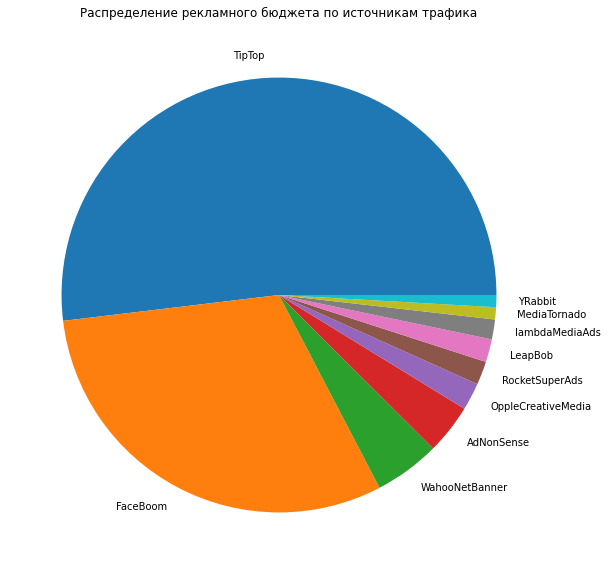

In [26]:
# сложим траты по источникам и построим пирожок
ad_costs = (costs.pivot_table(index='channel', values = 'costs', aggfunc='sum')
            .reset_index()
            .sort_values(by = 'costs', ascending = False))


# для наглядности посчитаем процентное соотношение затрат на каждый источник
ad_costs['part %'] = round(ad_costs['costs']/total_costs*100)
ad_costs

plt.figure(figsize=(10, 10))
plt.pie(ad_costs['costs'], labels = ad_costs['channel'])
plt.title('Распределение рекламного бюджета по источникам трафика')
plt.show()

Выводы:
1. Лидеры по затратам - TipTop и FaceBoom, суммарно на них тратится 83% рекламного бюджета
2. На остальные 8 каналов тратится оставшиеся 17% бюджета

### Динамика затрат на рекламу

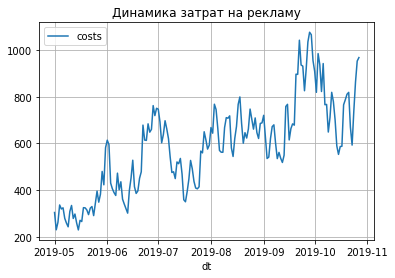

In [27]:
costs.groupby(['dt']).agg({'costs':'sum'}).plot()
plt.title('Динамика затрат на рекламу')
plt.grid()
plt.show()

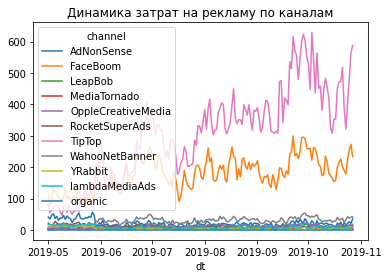

In [28]:
profiles.pivot_table(index='dt', columns='channel', values='acquisition_cost', aggfunc='sum').plot()
plt.title('Динамика затрат на рекламу по каналам')
plt.show()

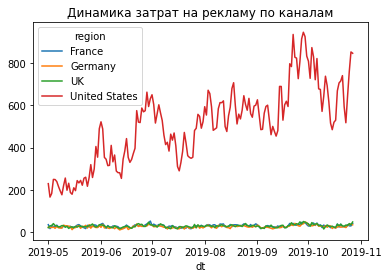

In [29]:
profiles.pivot_table(index='dt', columns='region', values='acquisition_cost', aggfunc='sum').plot()
plt.title('Динамика затрат на рекламу по каналам')
plt.show()

Выводы:
 1. Судя по графику суммарные траты на рекламу волнообразно растут
 2. Наблюдаем рост трат на TipTip и Faceboom из США
 3. Траты на другие источники стабильно низкие по сравнению с лидерами

### Расчёт CAC

#### Рассчёт среднего CAC на одного пользователя для всего проекта

In [30]:
# найдем количество пользователей привлеченных с рекламы и поделим общие затраты на это число
mean_cac = total_costs/len(profiles.query('channel != "organic"')['user_id'].unique())
print(f'Средняя стоимость привлечения одного пользователя {round(mean_cac,3)}')

Средняя стоимость привлечения одного пользователя 1.127


#### Рассчёт среднего CAC по каналам привлечения

,acquisition_cost
channel,
TipTop,2.799003
FaceBoom,1.113286
AdNonSense,1.008054
lambdaMediaAds,0.724802
WahooNetBanner,0.602245
RocketSuperAds,0.412095
OppleCreativeMedia,0.250000
YRabbit,0.218975
MediaTornado,0.218717


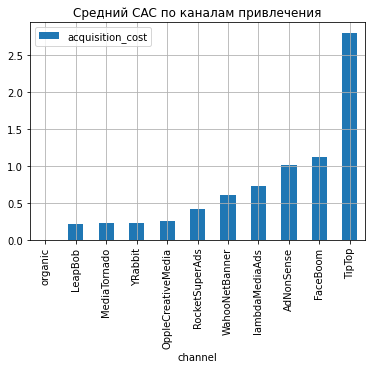

In [31]:
profiles.groupby('channel').agg({'acquisition_cost':'mean'}).sort_values(by = 'acquisition_cost').plot(kind = 'bar', grid = True)
plt.title('Средний CAC по каналам привлечения')
profiles.groupby('channel').agg({'acquisition_cost':'mean'}).sort_values(by = 'acquisition_cost', ascending = False)

Выводы:
 1. Самая высокая стоимость привлечения клиентов у канала TipTop, она в 2.5 раза превышает стоимость у ближайшего канала     Faceboom
 2. Пока это соотносится с суммарными затратами на маркетинг

#### Рассчёт среднего CAC по странам

,acquisition_cost
region,
United States,0.909268
Germany,0.295322
France,0.290887
UK,0.288393


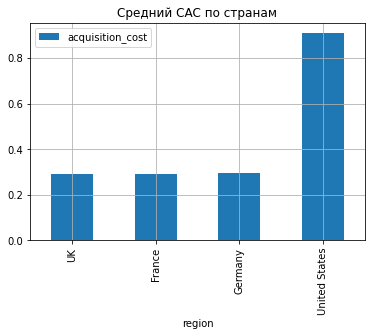

In [32]:
profiles.groupby('region').agg({'acquisition_cost':'mean'}).sort_values(by = 'acquisition_cost').plot(kind = 'bar', grid = True)
plt.title('Средний CAC по странам')
profiles.groupby('region').agg({'acquisition_cost':'mean'}).sort_values(by = 'acquisition_cost',ascending = False)

### Выводы по маркетингу:

Выводы:
1. Лидеры по затратам - TipTop и FaceBoom, суммарно на них тратится 83% рекламного бюджета
2. На остальные 8 каналов тратится оставшиеся 17% бюджета
1. Судя по графику суммарные траты на рекламу волнообразно растут
2. Был рост трат на TipTip и Faceboom до июля, потом  небольшие коррекции
3. Траты на другие источники стабильно низкие по сравнению с лидерами
1. Самая высокая стоимость привлечения клиентов у канала TipTop ( 2.7), она в 2.5 раза превышает стоимость у ближайшего канала     Faceboom (1.1) и AdNonSense (1)
2. Пока это соотносится с суммарными затратами на маркетинг
3. Больше всего средств тратится на пользователей из США


## Оценка окупаемости рекламы

### Анализ общей окупаемости рекламы, построение графиков LTV, ROI и CAC

In [33]:
profiles = profiles.query('channel != "organic"')

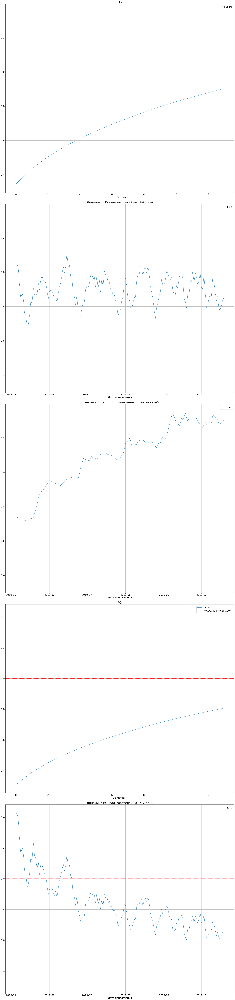

In [34]:
ltv_raw, ltv, ltv_history, roi, roi_history = get_ltv(
    profiles, orders, datetime(2019, 11, 1).date(), 14
)
plot_ltv_roi(ltv, ltv_history, roi, roi_history, 14 , window=5)

Выводы:
1. Общий LTV растет - это нормально
2. LTV пользователей колеблется от 0.6 до 1, что меньше средних затрат на рекламу одного человека
3. С июня наблюдается скачок стоимости затрат на одного человека - с 0.3 до 0.7-0.9
4. На лайфтайме 14 дней мы не выходим на окупаемость рекламы
5. Пользователи привлеченные до июля окупали себя, причем лучше всего - майские

### Анализ окупаемости с разбивкой по каналам

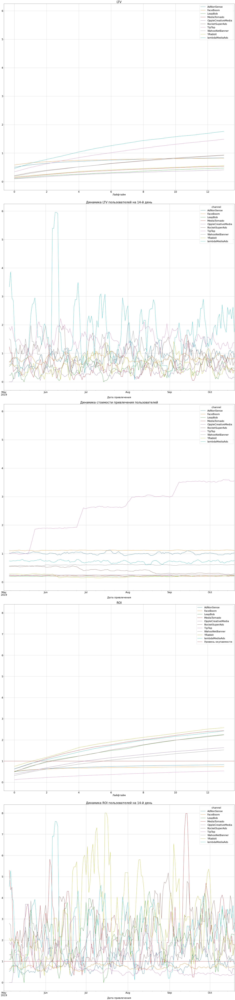

In [35]:
ltv_raw, ltv, ltv_history, roi, roi_history = get_ltv(
    profiles, orders, datetime(2019, 11, 1).date(), 14, dimensions = ['channel']
)
plot_ltv_roi(ltv, ltv_history, roi, roi_history, 14 , window=5)

Выводы:
1. С точки зрения LTV больше всего прибыли приносят пользователи, привлеченные из
канала AdNonSense
2. Пользователи из TipTop, AdNonSence и Faceboom так и не выходят на окупаемость - ни в одной из когорт по дате привлечения
3. Наблюдаем скачкообразный рост стоимости привлечения пользователей из TipTop 

### Анализ окупаемости с разбивкой по странам

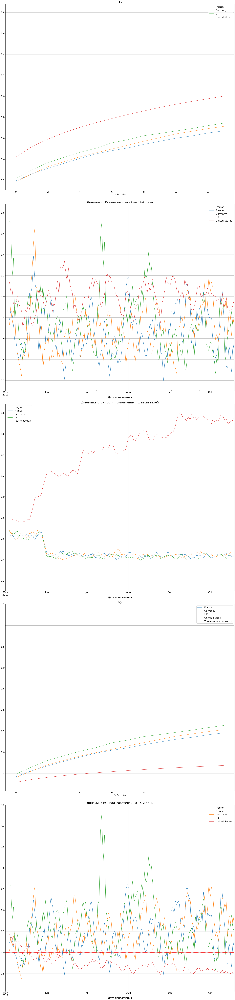

In [36]:
ltv_raw, ltv, ltv_history, roi, roi_history = get_ltv(
    profiles, orders, datetime(2019, 11, 1).date(), 14, dimensions = ['region']
)
plot_ltv_roi(ltv, ltv_history, roi, roi_history, 14 , window=4)

Выводы:
1. С июня наблюдаем рост скачок с последующим ростом стоимости привлечения пользователя из США, при этом стоимость в других странах упала
2. Только пользователи из США не выходят на окупаемость (пользователи привлченные начиная с  июня)
3. При этом LTV больше в США

### Анализ ситуации в США

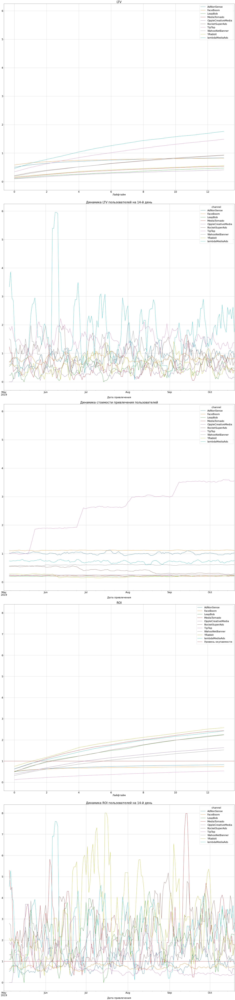

In [37]:
usa_profiles = profiles.query('region == "USA"')
ltv_raw, ltv, ltv_history, roi, roi_history = get_ltv(
    profiles, orders, datetime(2019, 11, 1).date(), 14, dimensions = ['channel']
)
plot_ltv_roi(ltv, ltv_history, roi, roi_history, 14 , window=5)

Выводы:
1. AdNonSence, TipTop и FaceBoom не окупаются и тащат общую окупаемость по стране вниз

### Графики конверсии и удержания

#### По странам

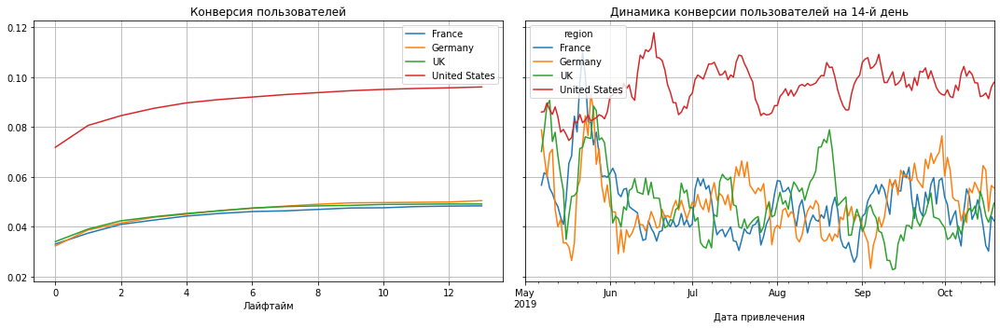

In [38]:
conversion_raw, conversion, conversion_history = get_conversion(
    profiles, orders, datetime(2019, 11, 1).date(), 14, dimensions=['region']
)

plt.rcParams.update({'font.size': 10})
plot_conversion(conversion, conversion_history, 14)

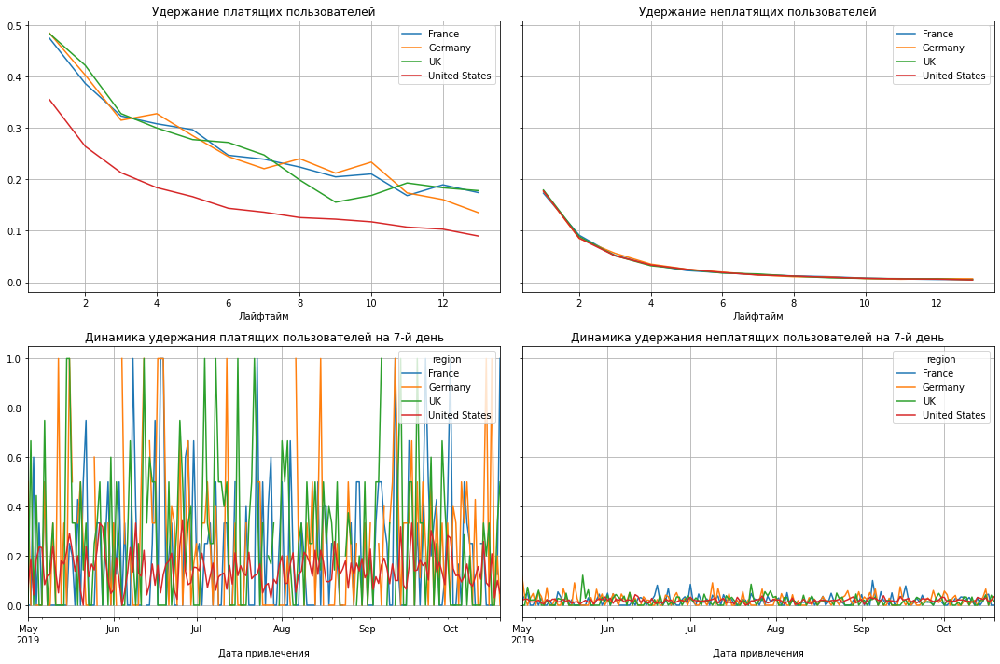

In [39]:
retention_raw, retention, retention_history = get_retention(
    profiles, sessions, datetime(2019, 11, 1).date(), 14, dimensions=['region']
)  
plt.rcParams.update({'font.size': 10})
plot_retention(retention, retention_history, 7) 

Выводы:
1. Самая лучшая конверсия у пользователей из США
2. Удержание платящих пользователей хуже всего в США, не платящих одинаковое

#### По устройствам

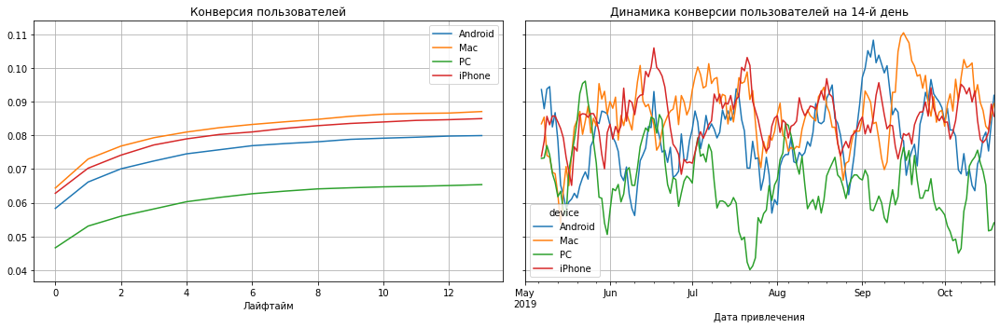

In [40]:
conversion_raw, conversion, conversion_history = get_conversion(
    profiles, orders, datetime(2019, 11, 1).date(), 14, dimensions=['device']
)

plt.rcParams.update({'font.size': 10})
plot_conversion(conversion, conversion_history, 14)

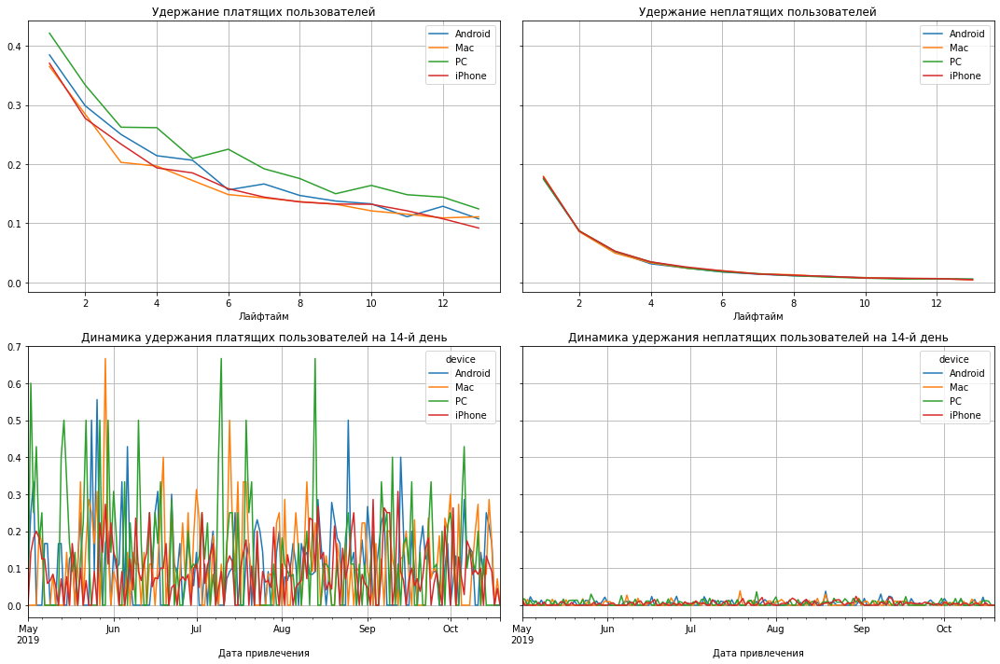

In [41]:
retention_raw, retention, retention_history = get_retention(
    profiles, sessions, datetime(2019, 11, 1).date(), 14, dimensions=['device']
)  

plot_retention(retention, retention_history, 14) 

Выводы:
1. Самая лучшая конверсия у пользователей с Mac и iPhone
2. Удержание в разрезе устройств у платящих пользователей - лучшее у PC

#### По рекламным каналам

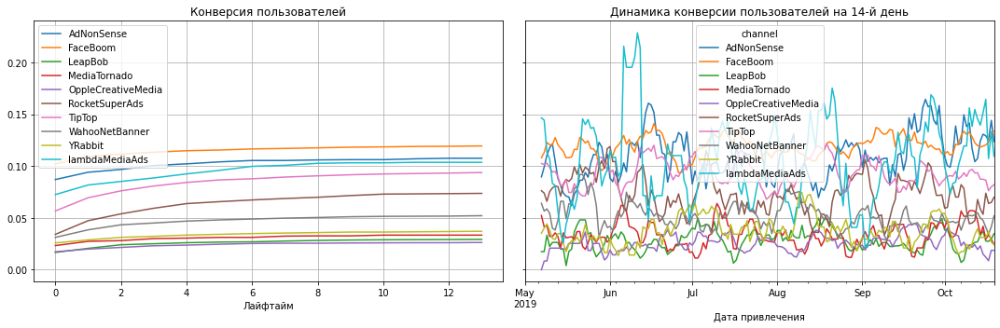

In [42]:
conversion_raw, conversion, conversion_history = get_conversion(
    profiles, orders, datetime(2019, 11, 1).date(), 14, dimensions=['channel']
)

plt.rcParams.update({'font.size': 10})
plot_conversion(conversion, conversion_history, 14)

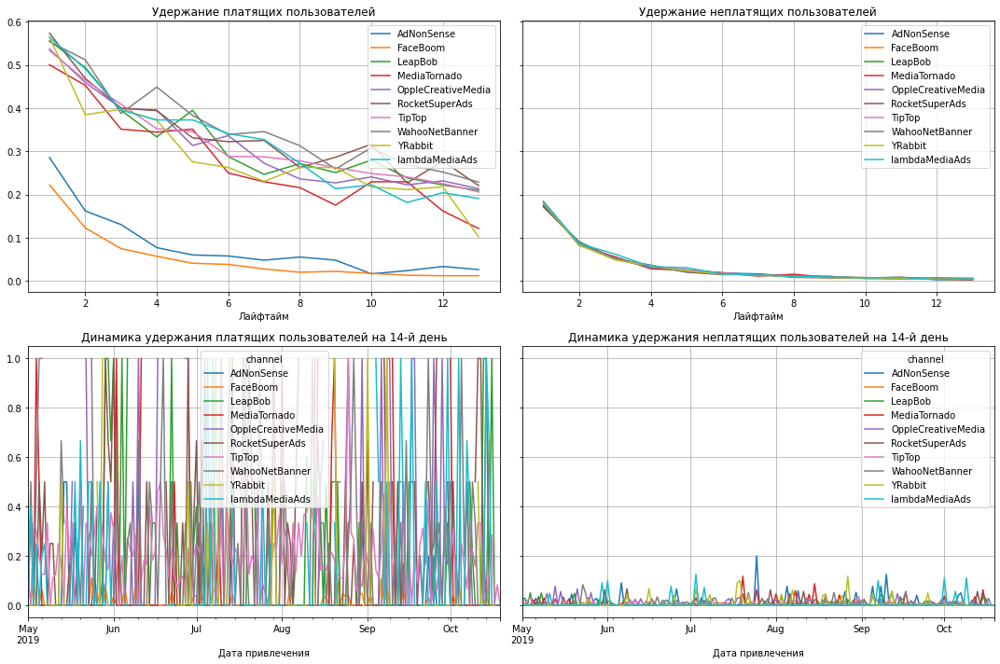

In [43]:
retention_raw, retention, retention_history = get_retention(
    profiles, sessions, datetime(2019, 11, 1).date(), 14, dimensions=['channel']
)  

plot_retention(retention, retention_history, 14) 

Выводы:
1. Самая лучшая конверсия у пользователей из каналов FaceBoom и AdNonSence
2. Удержание у платящих пользователей хуже в AdNonSence и Faceboom

### Вывод по оценке окупаемости рекламы

- Наша не реклама окупается, на лайфтайме 14 дней мы не выходим на окупаемость рекламы
- LTV пользователей колеблется от 0.6 до 0.8, что меньше средних затрат на рекламу одного человека (1.127)
- С июня наблюдается скачок стоимости затрат на одного человека - с 0.3 до 0.7-0.9
- В среднем пользователи привлеченные до июля окупали себя, причем лучше всего - майские

- С точки зрения LTV больше всего прибыли приносят пользователи, привлеченные из
  канала AdNonSense
- Пользователи из TipTop, AdNonSence, Faceboom и из США так и не выходят на окупаемость - ни в одной из когорт по дате привлечения
- Наблюдаем скачкообразный рост стоимости привлечения пользователей из TipTop и США
- Самая лучшая конверсия у пользователей из США, из каналов FaceBoom и AdNonSence с Mac и iPhone
- Удержание платящих пользователей хуже всего в США,  лучшее у PC, в organic и Faceboom


## Общий вывод и рекомендации

В ходе нашего исследования мы проанилизировали пользовательские профили, затраты на рекламу, доход от пользователей и удержание. По итогам мы выяснили, что затраты на рекламу не окупаются, начиная с июля. 
Далее мы углубились в структуру рекламного бюджета и обнаружили, что большую часть средств компания тратит на пользователей из США по каналам TipTop и FaceBoom. 
Самую большую стоимость привлечения одного пользователя имеют пользователи из США и TipTop.
При этом пользователи из TipTop и США имеют самую низкую ROI. Так же мы наблюдаем росто стоимости привлечения пользователей из этих когорт,видимо это и повлияло на неокупаемость.

Можем отметить, что пользователи из США до июня окупали себя, потом нет. Рассмотрев в деталях ситуацию в США, мы пришли к выводу, что не окупаются только каналы AdNonSence, TipTop и FaceBoom, остальные окупают свои затраты.

То есть большую часть бюджета компания тратит на привлечение пользователей, которые так и выходят на окупаемость.
Возможно это было вызвано попыткой сохранить количество пользователей привлеченных пользователей из США, TipTop при росте затрат на них. Однако при этом их покупки не оправдывали затрат на рекламу.

Рекомендуем перераспределить рекламный бюджет, уменьшить затраты на пользователей из США (или в США уменьшить затраты на AdNonSence, TipTop и FaceBoom) и TipTop, например в пользу LambdaMediaAds, Yrabbit и MediaTornado. По устройствам - привлекать польщзователей Mac, iPhone и Android.
